In [1]:
import pickle
import random
import os
import sys
sys.path.insert(1, './scripts')
from plot_no_coords import plot_densities_from_processed_data
from helper_functions import *
with open('/scratch1/RDARCH/rda-ghpcs/Rey.Koki/SmokeViz_code/deep_learning/dataset_pointers/pseudo/pseudo.pkl', 'rb') as handle:
    data_dict = pickle.load(handle)
from plot_results import plot_test_results
from apply_ML import run_model_single_fn, load_ckpt
import matplotlib.pyplot as plt
import numpy as np
import skimage
from glob import glob
import os
from PIL import Image, ImageOps
from datetime import datetime
import math
import json
# import segmentation_models_pytorch as smp

ERROR 1: PROJ: proj_create_from_database: Open of /scratch1/RDARCH/rda-ghpcs/Annabel.Wade/miniconda3/envs/smoke/share/proj failed


In [2]:
def get_datetime(fn):
    start = fn.split('/')[-1].split('_')[1][1:-1]
    start_dt = datetime.strptime(start, '%Y%j%H%M%S')
    start_readable = start_dt.strftime('%Y/%m/%d %H:%M UTC')
    #start_readable = start_dt.strftime('%H:%M UTC')
    return start_readable

def get_mesh(num_pixels):
    x = np.linspace(0,num_pixels-1,num_pixels)
    y = np.linspace(0,num_pixels-1,num_pixels)
    X, Y = np.meshgrid(x,y)
    return X,Y

def plot_smokeviz_hms(fns ,preds, ious): 
    print(len(fns))
    n_rows = 2
    n_cols = 5
    col_indices = list(range(n_cols)) * n_rows
    row_indices = []
    for i in range(n_rows):
        row_indices.extend([i]*n_cols)
    fig, ax = plt.subplots(n_rows,n_cols, figsize=(n_cols*4, n_rows*4))
    fns = fns*n_rows
    print(row_indices)
    print(col_indices)
    print(len(fns))
    print(len(row_indices))
    y_labels = ['HMS Label', ' SmokeViz']
    colors = ['red', 'orange', 'yellow']
    
    for idx, fn in enumerate(fns):
        row_idx = row_indices[idx]
        col_idx = col_indices[idx]
        print(fn)
        data_fn = fn.replace('truth', 'data')
        RGB = skimage.io.imread(data_fn, plugin='tifffile')
        truths = skimage.io.imread(fn, plugin='tifffile')
        
        if row_idx ==0:
            num_pixels = RGB.shape[1]
            X, Y = get_mesh(num_pixels)
            
            ax[row_idx, col_idx].imshow(RGB)
            for i in reversed(range(3)):
                ax[row_idx, col_idx].contour(X,Y,truths[:,:,i],levels =[.99],colors=[colors[i]])
            ax[row_idx, col_idx].set_title(get_datetime(fn), fontsize=20)
        else:
            pred = preds[idx-5]
            ax[row_idx, col_idx].imshow(RGB)
            for i in reversed(range(3)):
                ax[row_idx, col_idx].contour(X,Y,pred[i,:,:],levels =[.99],colors=[colors[i]])
            ax[row_idx, col_idx].set_xlabel(np.round(ious[idx-5],3), fontsize=15)
        ax[row_idx, col_idx].set_yticks([])
        ax[row_idx, col_idx].set_xticks([])
            
        if col_idx == 0:
            ax[row_idx, col_idx].set_ylabel(y_labels[row_idx], fontsize=20)                
    plt.tight_layout(pad=-.1)
    plt.savefig('results.png',bbox_inches='tight', dpi=300)
    plt.show()

# plot_smokeviz_hms(truth_fns, preds, ious)

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif
Loading from checkpoint at /scratch1/RDARCH/rda-ghpcs/Annabel.Wade/semantic_segmentation_smoke/scripts/deep_learning/models/DeepLabV3Plus_exp1_1733642366.pth (epoch 46, best_val_iou 3.2471439838409424)
ckpt /scratch1/RDARCH/rda-ghpcs/Annabel.Wade/semantic_segmentation_smoke/scripts/deep_learning/models/DeepLabV3Plus_exp1_1733642366.pth
 best_val_iou: 3.2471439838409424 
epoch: 46
0.6909


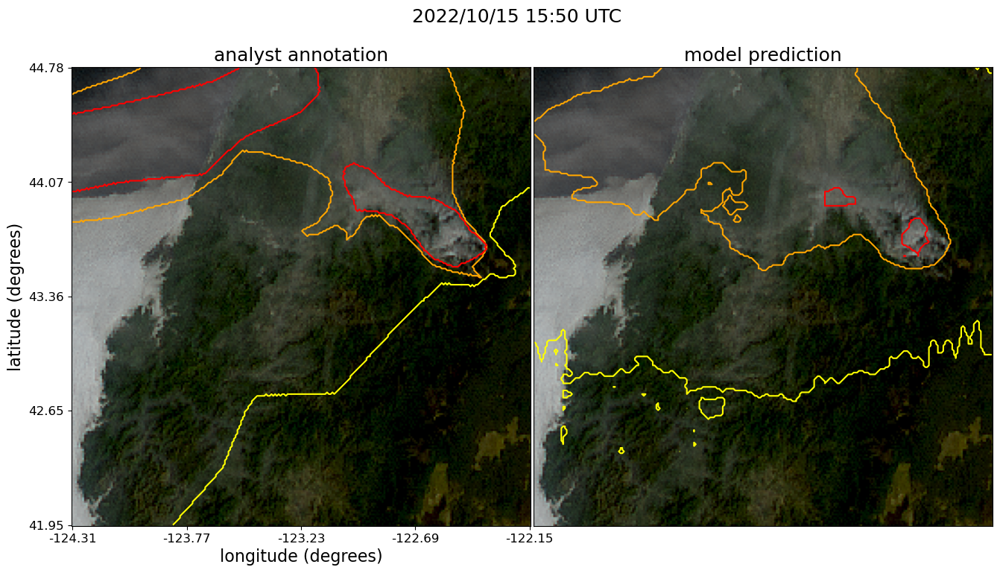

12
[0, 0, 0, 0, 0, 1, 1, 1, 1, 1]
[0, 1, 2, 3, 4, 0, 1, 2, 3, 4]
24
10
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/132/G16_s20221322300206_35.84_-103.65_23.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/149/G17_s20221491430321_33.11_-108.26_26.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/022/G17_s20220221350321_18.3_-71.3_100.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/274/G16_s20222742350202_34.04_-98.23_25.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/086/G17_s20220861340321_35.53_-83.01_126.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G17_s20221491250321_28.76_-107.5_52.tif


IndexError: list index out of range

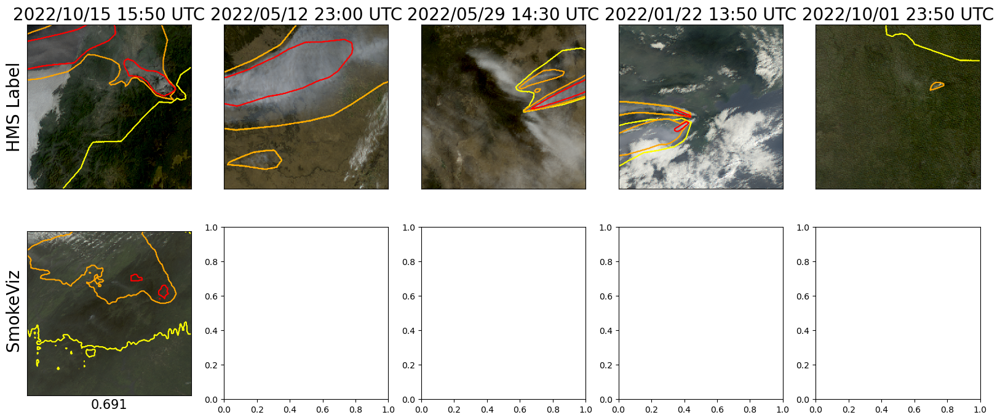

In [3]:
files_to_plot = [
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/132/G16_s20221322300206_35.84_-103.65_23.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/149/G17_s20221491430321_33.11_-108.26_26.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/022/G17_s20220221350321_18.3_-71.3_100.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/274/G16_s20222742350202_34.04_-98.23_25.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/086/G17_s20220861340321_35.53_-83.01_126.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G17_s20221491250321_28.76_-107.5_52.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/149/G17_s20221491430321_33.11_-108.26_26.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/022/G17_s20220221350321_18.3_-71.3_100.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/274/G16_s20222742350202_34.04_-98.23_25.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/086/G17_s20220861340321_35.53_-83.01_126.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G17_s20221491250321_28.76_-107.5_52.tif',
]

more =[
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/270',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/270',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/270',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/270',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/270',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/270',
]

exp_nums = [
    '1',
]

model_pths = [
    '/scratch1/RDARCH/rda-ghpcs/Annabel.Wade/semantic_segmentation_smoke/scripts/deep_learning/models/DeepLabV3Plus_exp1_1733642366.pth'
]
preds=[]; ious=[]

for fn in files_to_plot:
    for pth in model_pths:
        print(fn)
        _,_,model,_ = load_ckpt('1')
        pred, iou = run_model_single_fn(fn, pth, model=model)
        preds.append(pred)
        ious.append(iou)
        plot_test_results(pred, fn)

    plot_smokeviz_hms(files_to_plot, preds, ious)

## Explore Imagery by Density

- we need to find examples of imagery where:
    - a light density annotation looks more like a heavy density plume
    - a heavy density annotation looks more like a light densiyt plume
- we need the imagery to have good contrast

In [2]:
#density = 'Medium' #'Light' 'Medium'
truth_fns = data_dict['test']['truth']
random.shuffle(truth_fns)

In [3]:
print(truth_fns[0])

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/252/G16_s20222522100204_48.5_-92.27_2.tif


/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/149/G17_s20221491430321_33.11_-108.26_26.tif
0.4819


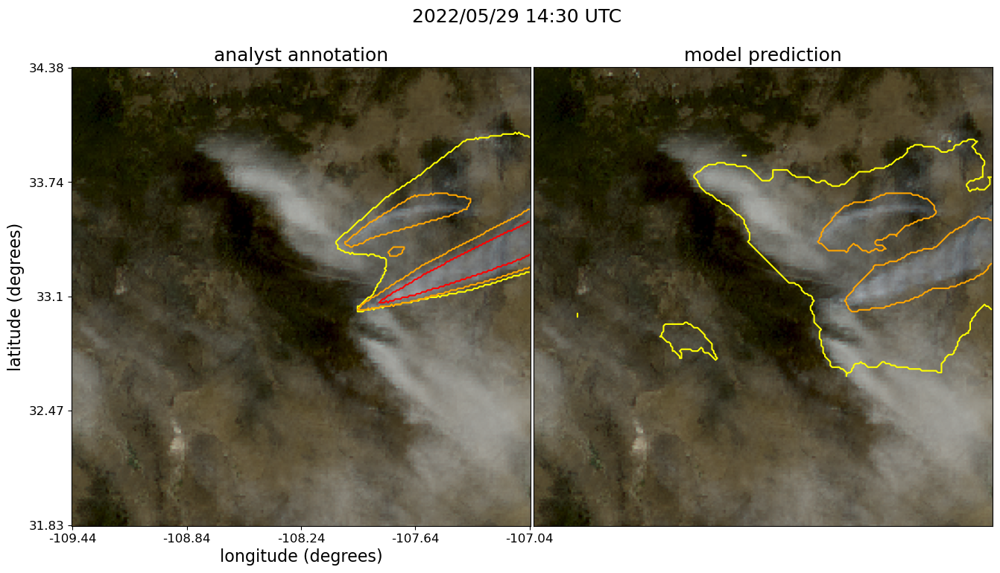

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/022/G17_s20220221350321_18.3_-71.3_100.tif
0.3326


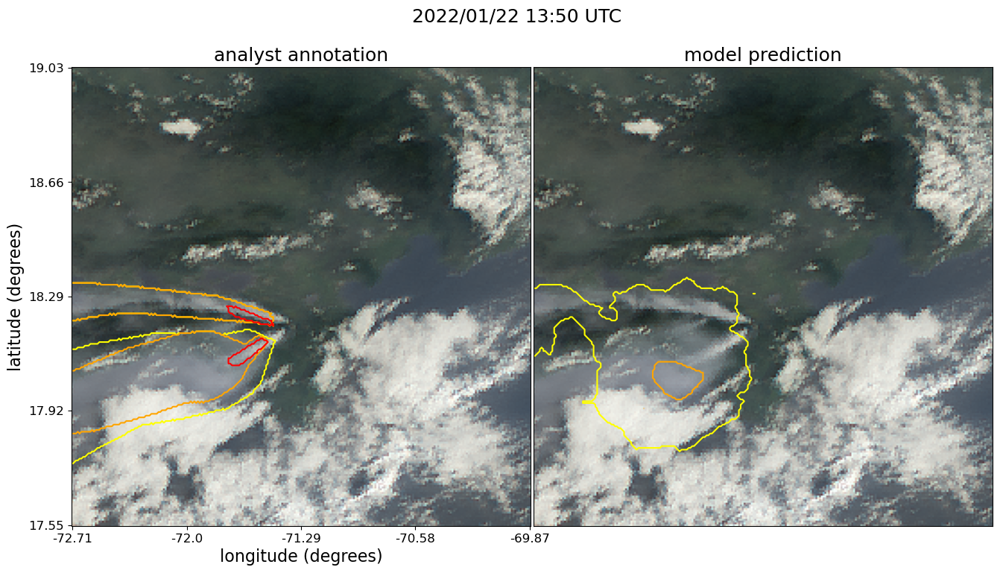

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/274/G16_s20222742350202_34.04_-98.23_25.tif
0.1405


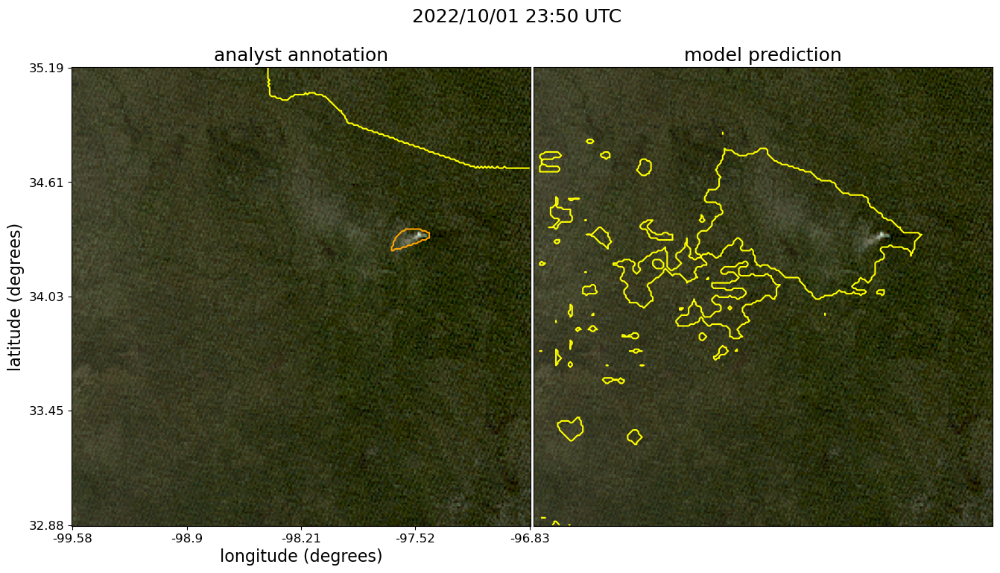

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/086/G17_s20220861340321_35.53_-83.01_126.tif
0.2357


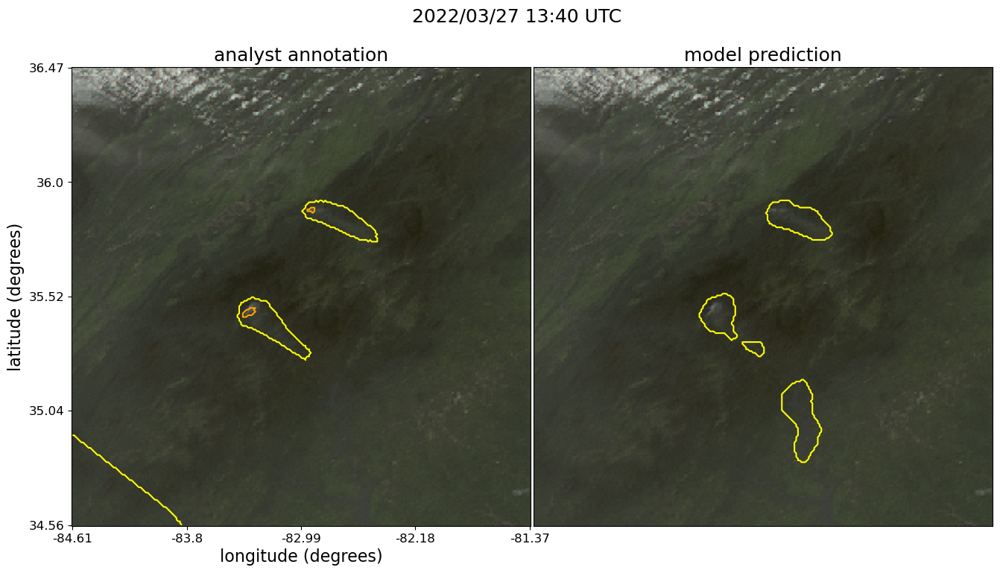

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G17_s20221491250321_28.76_-107.5_52.tif
0.7597


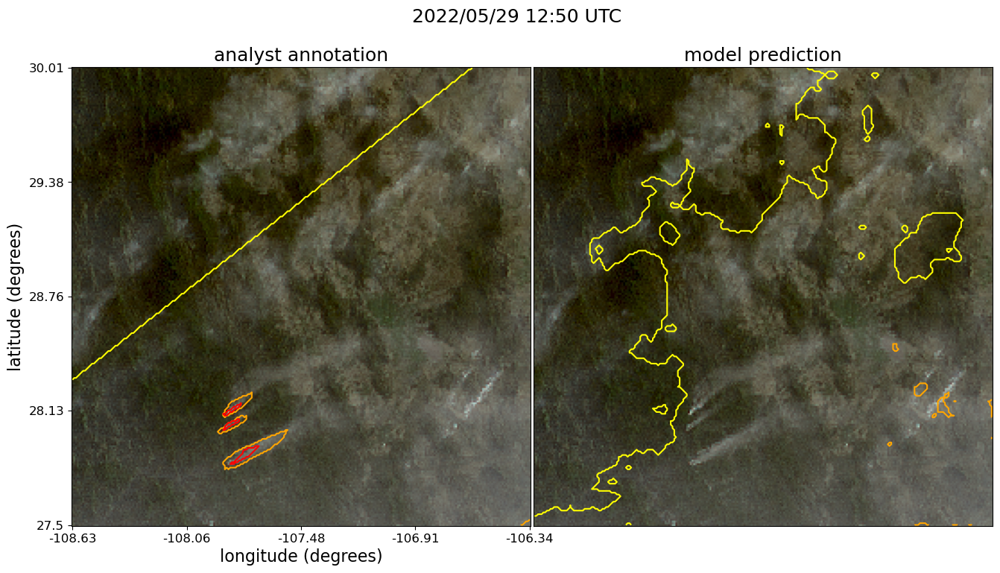

In [4]:
num_imgs = 300#len(data_dict['test']['truth'])
num = 0
truth_fns = random.choices(data_dict['test']['truth'], k=num_imgs)
truth_fns = ["/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/176/G16_s20221762040203_33.15_-98.32_5.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/132/G16_s20221322300206_34.31_-106.94_14.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/143/G16_s20221432350207_25.45_-106.76_10.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/234/G18_s20222341600206_41.3_-122.75_5.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/171/G16_s20221720010214_31.74_-115.31_33.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/097/G16_s20220980000203_33.36_-104.61_33.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/043/G16_s20220432240205_35.79_-98.41_15.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/291/G16_s20222912300203_44.68_-115.98_73.tif", 
             "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/151/G16_s20221520030205_33.93_-106.96_25.tif"]
truth_fns = [
#"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/114/G16_s20221142150203_33.44_-89.53_44.tif",
#"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/131/G16_s20221312220206_28.75_-107.72_16.tif",
"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/270/G16_s20222702300206_45.98_-116.42_31.tif",
"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/060/G16_s20220602210206_33.58_-95.08_218.tif",

"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/176/G16_s20221762040203_33.15_-98.32_5.tif",
#"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/132/G16_s20221322300206_34.31_-106.94_14.tif",
"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/097/G16_s20220980000203_33.36_-104.61_33.tif",
"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/171/G16_s20221720010214_31.74_-115.31_33.tif"]
#"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/097/G16_s20220980000203_33.36_-104.61_33.tif"]
#"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/043/G16_s20220432240205_35.79_-98.41_15.tif"]


# /scratch1/RDARCH/rda-ghpcs/Rey.Koki/SmokeViz/truth/2022/Medium/G18_s20222881550206_e20222881559514_70.tif
# scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/*/*/G18_s20222881550206_*.tif
# /scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.96_-124.74_115.tif

# /scratch1/RDARCH/rda-ghpcs/Rey.Koki/SmokeViz/truth/2022/Heavy/G16_s20220662130203_e20220662139511_74.tif
truth_fns_good = [
     '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/130/G16_s20221302320205_38.03_-102.97_32.tif', # KEEP good
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif', # KEEP good
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G16_s20221492300203_33.52_-106.92_71.tif',
'/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/049/G16_s20220492230208_38.0_-120.49_31.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/132/G16_s20221322300206_35.84_-103.65_23.tif', # keep good
]

# BAD
truth_fns = [
    # '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/288/G18_s20222881550206_48.64_-120.51_82.tif', # KEEP bad 
    "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/149/G17_s20221491430321_33.11_-108.26_26.tif", # keep bad 
    # "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G17_s20221491240321_26.21_-107.89_56.tif",
    "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/022/G17_s20220221350321_18.3_-71.3_100.tif",
    "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/274/G16_s20222742350202_34.04_-98.23_25.tif",
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Medium/086/G17_s20220861340321_35.53_-83.01_126.tif',
    "/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G17_s20221491250321_28.76_-107.5_52.tif", # despite high IoU from the light density, the model did not detect the medium density / notable small plumes
]


preds = []
ious = []
for fn in truth_fns:
    print(fn)
    pred, iou = run_model_single_fn(fn)
    preds.append(pred)
    ious.append(iou)
    plot_test_results(pred, fn)
    num+=1
    if num >= num_imgs:
        break

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/130/G16_s20221302320205_38.03_-102.97_32.tif
0.8568


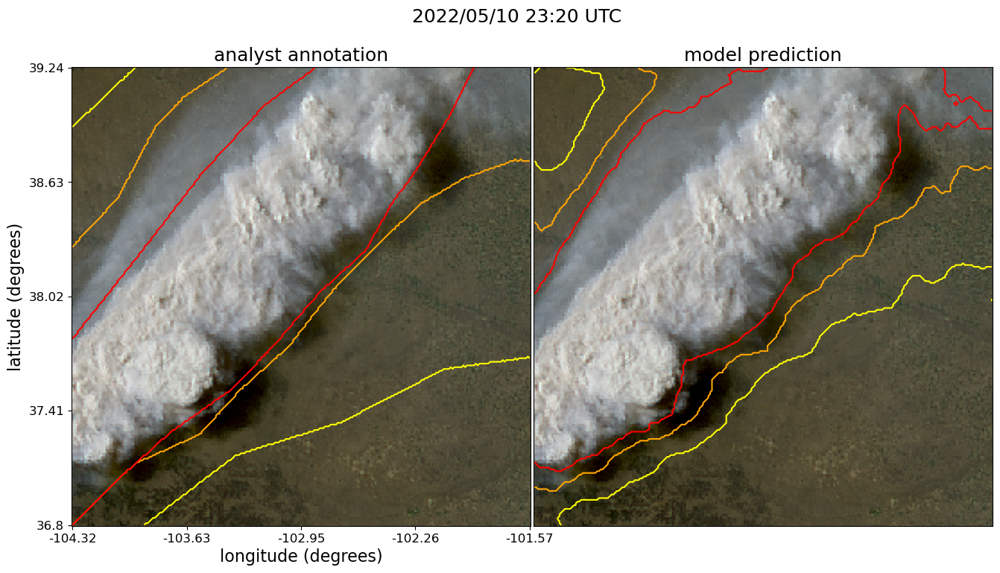

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif
0.6246


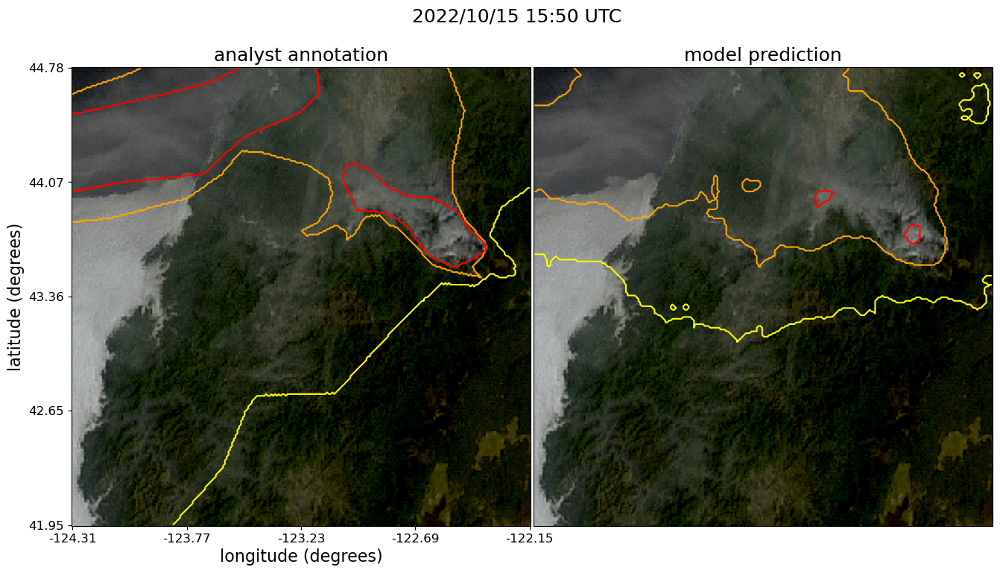

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G16_s20221492300203_33.52_-106.92_71.tif
0.7554


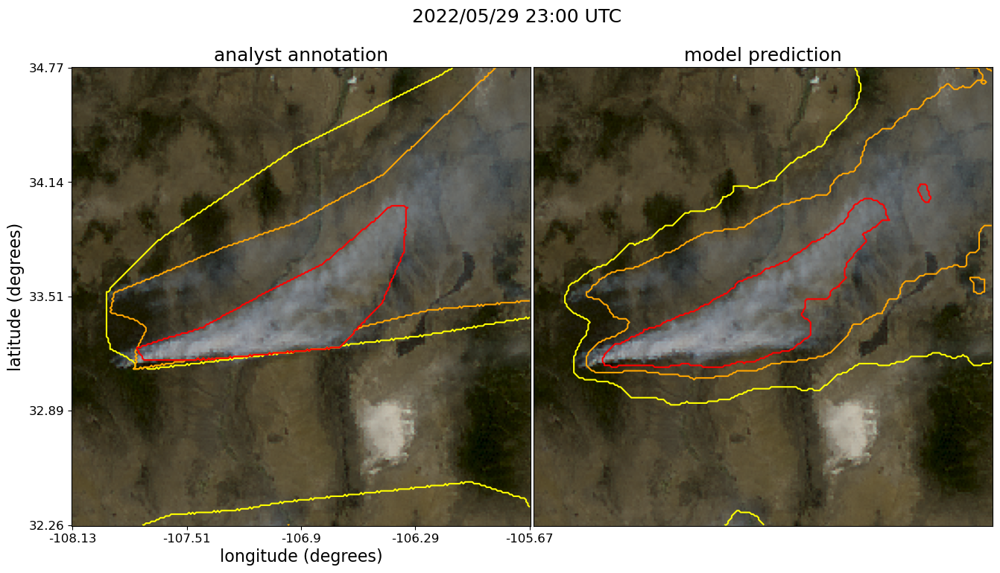

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/049/G16_s20220492230208_38.0_-120.49_31.tif
0.7718


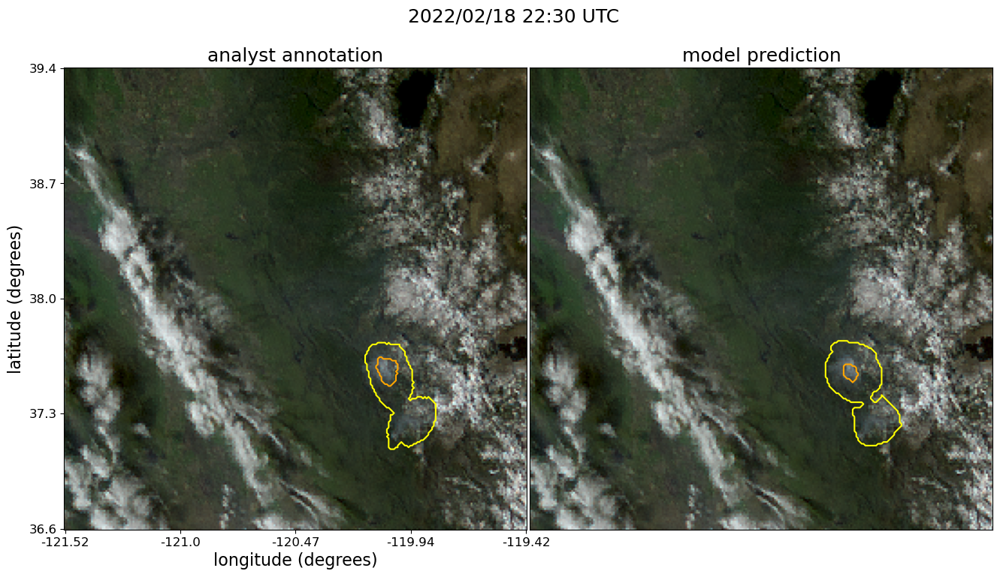

/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/132/G16_s20221322300206_35.84_-103.65_23.tif
0.7783


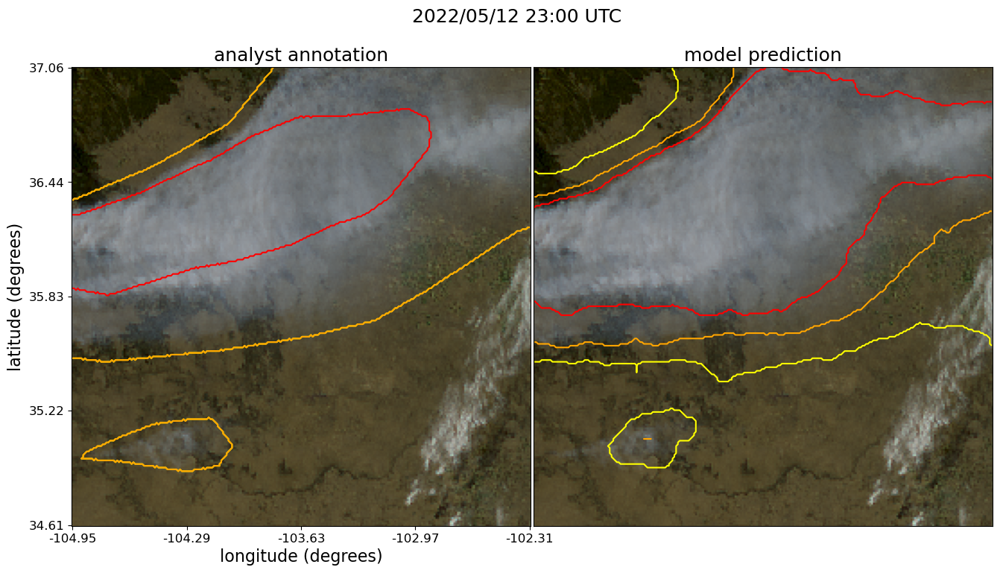

5
[0, 0, 0, 0, 0, 1, 1, 1, 1, 1]
[0, 1, 2, 3, 4, 0, 1, 2, 3, 4]
10
10
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/130/G16_s20221302320205_38.03_-102.97_32.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G16_s20221492300203_33.52_-106.92_71.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/049/G16_s20220492230208_38.0_-120.49_31.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/132/G16_s20221322300206_35.84_-103.65_23.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/130/G16_s20221302320205_38.03_-102.97_32.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G16_s20221492300203_33.52_-106.92_71.tif
/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/049/G16_s20220492230208_38.0_-120.49_31.tif
/scratch1/RD

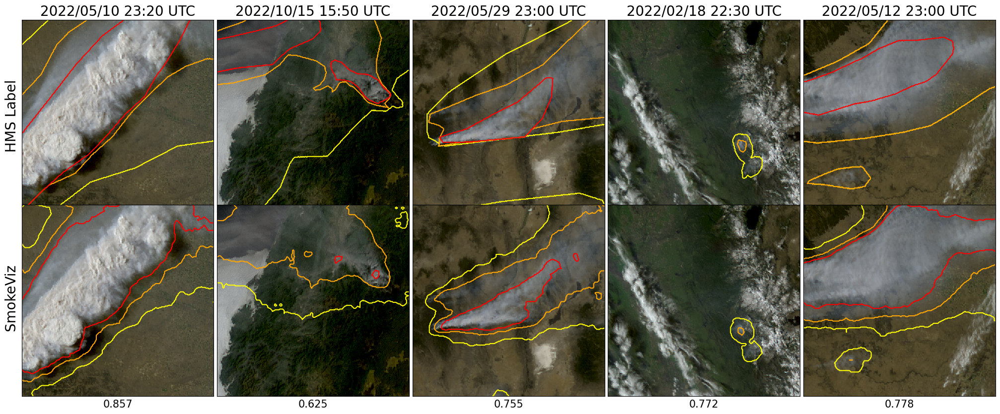

In [6]:
truth_fns_good = [
     '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/130/G16_s20221302320205_38.03_-102.97_32.tif', # KEEP good
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/288/G18_s20222881550206_43.37_-123.25_114.tif', # KEEP good
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/149/G16_s20221492300203_33.52_-106.92_71.tif',
'/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/049/G16_s20220492230208_38.0_-120.49_31.tif',
    '/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Heavy/132/G16_s20221322300206_35.84_-103.65_23.tif', # keep good
]

preds = []
ious = []
for fn in truth_fns_good:
    print(fn)
    pred, iou = run_model_single_fn(fn)
    preds.append(pred)
    ious.append(iou)
    plot_test_results(pred, fn)
    num+=1
    if num >= num_imgs:
        break


plot_smokeviz_hms(truth_fns_good, preds, ious)

In [63]:
# num_imgs = 500
# num = 0

# #"/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/Light/043/G16_s20220432240205_35.79_-98.41_15.tif"]
# truth_fns = data_dict['test']['truth']
# random.shuffle(truth_fns)
# preds = []
# ious = []
# # truth_fns = glob("/scratch1/RDARCH/rda-ghpcs/Rey.Koki/PL2/truth/2022/*/149/*tif")
# for fn in truth_fns:
#     print(fn)
#     pred, iou = run_model_single_fn(fn)
#     preds.append(pred)
#     ious.append(iou)
#     plot_test_results(pred, fn)
#     num+=1
#     if num >= num_imgs:
#         break